In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os


In [37]:
pwd = f'/fsx/example-case/geometry_study_re100_transient/'
pwd = f'/fsx/example-case/bezier_geometry_re100_transient/dataset_test'
csv_files = os.listdir(pwd)
csv_files.sort()
print('Available files are:\n')
for csv_file in csv_files:
    print(csv_file)

Available files are:

post_process_1.py
post_process_2.py
shape_0
shape_1


In [43]:
obstacle = 'shape_0'

# pwd = f'/fsx/example-case/geometry_study_re100_transient/{obstacle}/extracts'
pwd = f'/fsx/example-case/bezier_geometry_re100_transient/dataset_test/{obstacle}/extracts'
csv_files = os.listdir(pwd)
csv_files.sort()
csv_files = [os.path.join(pwd, csv_file) for csv_file in csv_files]

ny = 200
nx = 500

print(f'There is {len(csv_files)} in this folder. There should be 500.')

There is 5 in this folder. There should be 500.


In [44]:
# u_x = np.zeros((len(csv_files), ny, nx))
# u_y = np.zeros((len(csv_files), ny, nx))
# u_z = np.zeros((len(csv_files), ny, nx))
# u_0_x = np.zeros((len(csv_files), ny, nx))
# u_0_y = np.zeros((len(csv_files), ny, nx))
# u_0_z = np.zeros((len(csv_files), ny, nx))
# p = np.zeros((len(csv_files), ny, nx))
# w_x = np.zeros((len(csv_files), ny, nx))
# w_y = np.zeros((len(csv_files), ny, nx))
w_z = np.zeros((len(csv_files), ny, nx))

for idx, csv_file in enumerate(csv_files):
    data = pd.read_csv(csv_file)
# #     u_x[idx,:,:] = np.array(data['U:0']).reshape(ny, nx)
# #     u_y[idx,:,:] = np.array(data['U:1']).reshape(ny, nx)
# #     u_z[idx,:,:] = np.array(data['U:2']).reshape(ny, nx)
# #     u_0_x[idx,:,:] = np.array(data['U_0:0']).reshape(ny, nx)
# #     u_0_y[idx,:,:] = np.array(data['U_0:1']).reshape(ny, nx)
# #     u_0_z[idx,:,:] = np.array(data['U_0:2']).reshape(ny, nx)
# #     p[idx,:,:] = np.array(data['p']).reshape(ny, 384)
# #     w_x[idx,:,:] = np.array(data['vorticity:0']).reshape(ny, nx)
# #     w_y[idx,:,:] = np.array(data['vorticity:1']).reshape(ny, nx)
    w_z[idx,:,:] = np.array(data['vorticity:2']).reshape(ny, nx)
# u_mag = np.sqrt(np.square(u_x)+np.square(u_y)+np.square(u_z))
# w_mag = np.sqrt(np.square(w_x)+np.square(w_y)+np.square(w_z))

# w_z

In [409]:
pwd = '/fsx/python_ml/flow_reconstruction/data'

if os.path.exists(os.path.join(pwd, obstacle)) != True:
    new_folder = os.path.join(pwd, obstacle)
    os.mkdir(new_folder)
    print(f'created {new_folder}')
    
# with open(os.path.join(pwd, obstacle, 'u_x.npy'), 'wb') as f:
#     np.save(f, u_x)
# with open(os.path.join(pwd, obstacle, 'u_y.npy'), 'wb') as f:
#     np.save(f, u_y)
# with open(os.path.join(pwd, obstacle, 'u_z.npy'), 'wb') as f:
#     np.save(f, u_z)
# with open(os.path.join(pwd, obstacle, 'u_0_x.npy'), 'wb') as f:
#     np.save(f, u_0_x)
# with open(os.path.join(pwd, obstacle, 'u_0_y.npy'), 'wb') as f:
#     np.save(f, u_0_y)
# with open(os.path.join(pwd, obstacle, 'u_0_z.npy'), 'wb') as f:
#     np.save(f, u_0_z)
# with open(os.path.join(pwd, obstacle, 'p.npy'), 'wb') as f:
#     np.save(f, p)
# with open(os.path.join(pwd, obstacle, 'w_x.npy'), 'wb') as f:
#     np.save(f, w_x)
# with open(os.path.join(pwd, obstacle, 'w_y.npy'), 'wb') as f:
#     np.save(f, w_y)
with open(os.path.join(pwd, obstacle, 'w_z.npy'), 'wb') as f:
    np.save(f, w_z)
# with open(os.path.join(pwd, obstacle, 'u_mag.npy'), 'wb') as f:
#     np.save(f, u_mag)
# with open(os.path.join(pwd, obstacle, 'w_mag.npy'), 'wb') as f:
#     np.save(f, w_mag)

created /fsx/python_ml/flow_reconstruction/data/triangle_ar_2p0


In [410]:
# del u_x
# del u_y
# del u_z
# del u_0_x
# del u_0_y
# del u_0_z
# del p
# del w_x
# del w_y
# del w_z
# del u_mag
# del w_mag

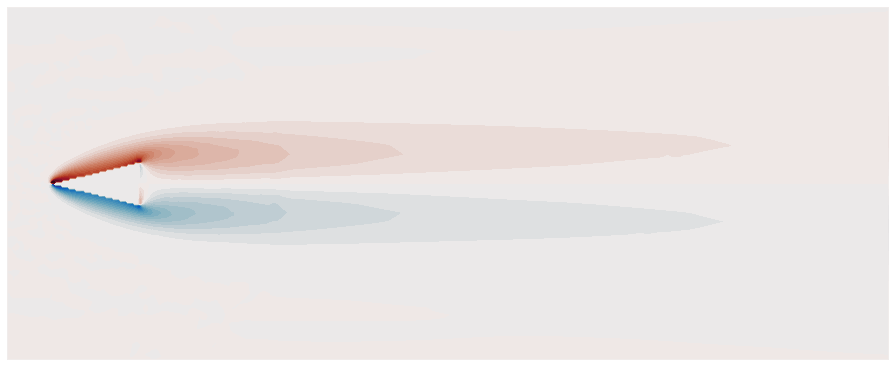

In [411]:
import cmocean
import matplotlib.patches as mpatches

sample_slice = 250

sample = w_z[sample_slice,:,:]
# sample =np.interp(sample, (sample.min(), sample.max()), (-5, +5))

plt.figure(facecolor="white",  edgecolor='k', figsize=(15.8,9.4))

x = np.arange(0, nx, 1)
y = np.arange(0, ny, 1)
mX, mY = np.meshgrid(x, y)
minmax1 = np.max(np.abs(sample)) * 0.65

im = plt.imshow(sample, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax1, vmax=minmax1)
plt.contourf(mX, mY, sample, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax1, vmax=minmax1)

wedge = mpatches.Wedge((0,99), 33, 270, 90, ec="#636363", color='#636363',lw = 5, zorder=200)
# im.axes.add_patch(p=wedge)    

plt.axis('off')
plt.savefig(f'data/{obstacle}/wz_plot.png')
plt.show()

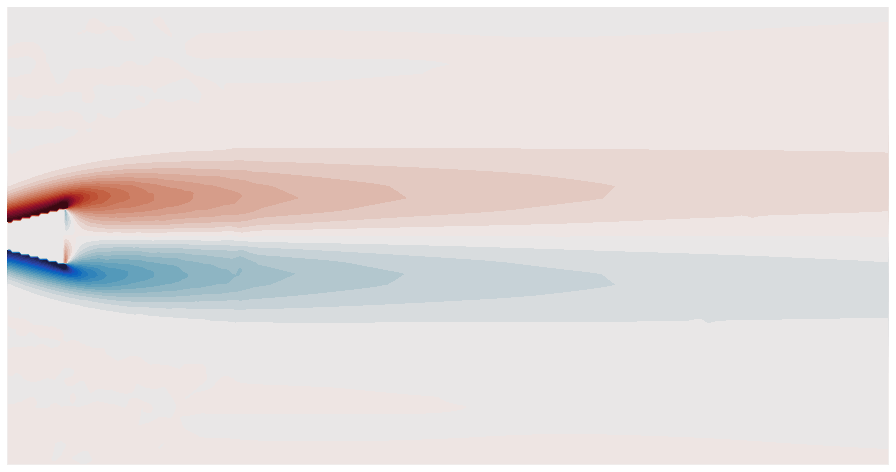

In [412]:
crop_start = 50
crop_end = 435
cropped_nx = crop_end-crop_start

cropped_sample = w_z[sample_slice,:,crop_start:crop_end]

plt.figure(facecolor="white",  edgecolor='k', figsize=(15.8,9.4))

x = np.arange(0, cropped_nx, 1)
y = np.arange(0, ny, 1)
mX, mY = np.meshgrid(x, y)
minmax1 = np.max(np.abs(cropped_sample)) * 0.65

im = plt.imshow(cropped_sample, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax1, vmax=minmax1)
plt.contourf(mX, mY, cropped_sample, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax1, vmax=minmax1)

wedge = mpatches.Wedge((0,99), 33, 270, 90, ec="#636363", color='#636363',lw = 5, zorder=200)
# im.axes.add_patch(p=wedge)    

plt.axis('off')
plt.savefig(f'data/{obstacle}/wz_cropped_plot.png')
plt.show()

['diamond_ar_2p0', 'square', 'diamond_ar_1p66', 'triangle_ar_0p83', 'diamond_ar_0p66', 'cylinder_half', 'triangle_ar_1p0', 'triangle_ar_1p25', 'diamond_ar_1p0', 'triangle_ar_0p56', 'triangle_ar_2p0', 'diamond_ar_0p71', 'diamond_ar_1p25', 'cylinder', 'cylinder_half_flipped', 'diamond_ar_1p5', 'triangle_ar_0p625', 'triangle_ar_0p66', 'triangle_ar_2p5', 'diamond_ar_0p83', 'diamond_ar_0p5', 'triangle_ar_1p66', 'triangle_ar_0p71', 'diamond_ar_2p5', 'triangle_ar_0p5', 'diamond_ar_0p56', 'triangle_ar_1p5', 'diamond_ar_0p625']


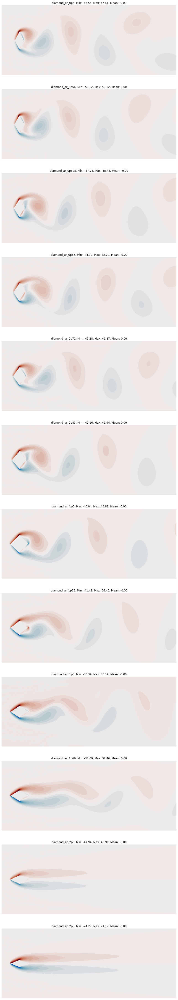

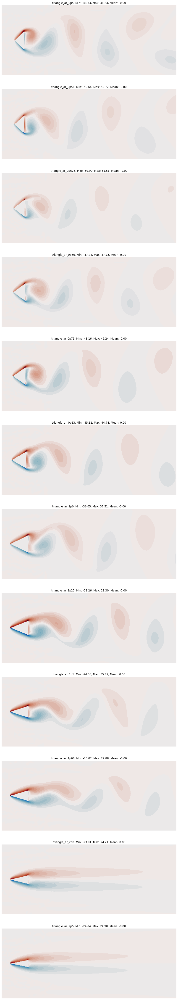

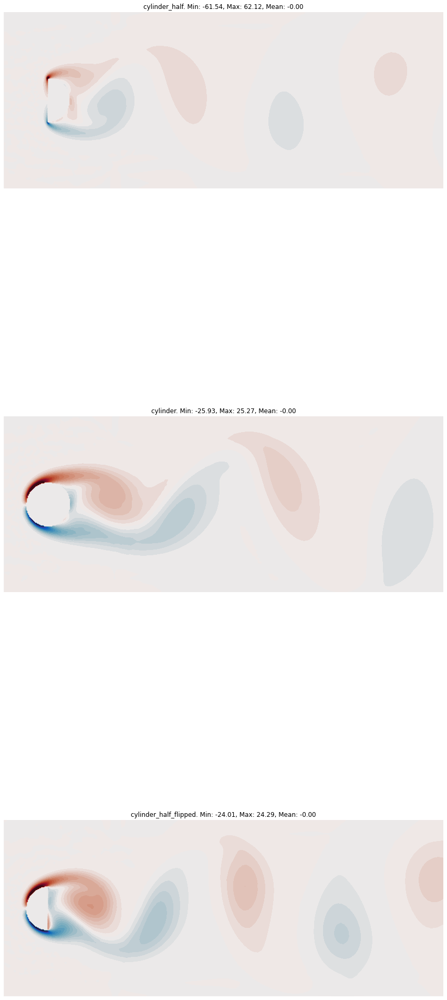

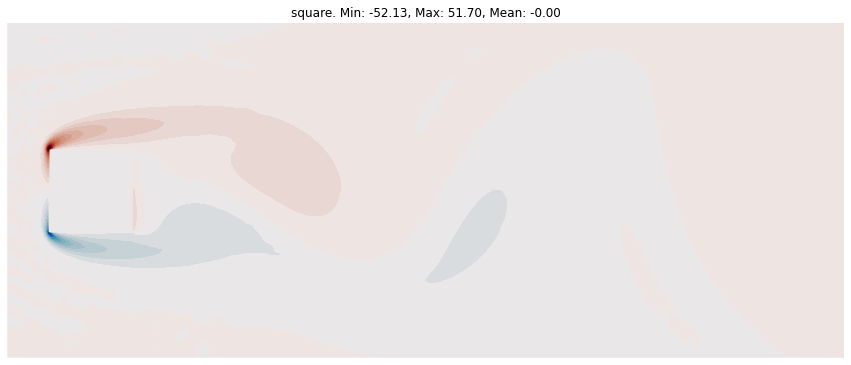

In [459]:
directories = os.listdir('./data')
directories = [directory for directory in directories if os.path.isdir(os.path.join('./data', directory))]
print(directories)

diamond_dir = [directory for directory in directories if 'diamond' in directory]
diamond_dir.sort()

triangle_dir = [directory for directory in directories if 'triangle' in directory]
triangle_dir.sort()

cylinder_dir = [directory for directory in directories if 'cylinder' in directory]

square_dir = [directory for directory in directories if 'square' in directory]

sample_slice = 300

fig, axs = plt.subplots(len(diamond_dir), 1, figsize=(15,80))
for idx, filepath in enumerate(diamond_dir):
    full_filepath = f'data/{filepath}/w_z.npy'
    data = np.load(full_filepath)
    data = np.transpose(data, (0, 2, 1))
    
    data_min = data.min()
    data_max = data.max()
    data_mean = data.mean()
    
    _, m, n = data.shape

    x = np.arange(0, m, 1)
    y = np.arange(0, n, 1)
    mX, mY = np.meshgrid(x, y)
    minmax = np.nanmax(np.abs(data[sample_slice,:,:])) * 0.65
    
    axs[idx].imshow(data[sample_slice,:,:].T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    axs[idx].contourf(mX, mY, data[sample_slice,:,:].T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax, vmax=minmax)
    
    axs[idx].set_title(f'{filepath}. Min: {data_min:.2f}, Max: {data_max:.2f}, Mean: {data_mean:.2f}')
    axs[idx].axis('off')
plt.savefig('data/diamond_data_summary.png')
plt.show()

fig, axs = plt.subplots(len(triangle_dir), 1, figsize=(15,80))
for idx, filepath in enumerate(triangle_dir):
    full_filepath = f'data/{filepath}/w_z.npy'
    data = np.load(full_filepath)
    data = np.transpose(data, (0, 2, 1))
    
    data_min = data.min()
    data_max = data.max()
    data_mean = data.mean()
    
    _, m, n = data.shape

    x = np.arange(0, m, 1)
    y = np.arange(0, n, 1)
    mX, mY = np.meshgrid(x, y)
    minmax = np.nanmax(np.abs(data[sample_slice,:,:])) * 0.65
    
    axs[idx].imshow(data[sample_slice,:,:].T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    axs[idx].contourf(mX, mY, data[sample_slice,:,:].T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax, vmax=minmax)
    
    axs[idx].set_title(f'{filepath}. Min: {data_min:.2f}, Max: {data_max:.2f}, Mean: {data_mean:.2f}')
    axs[idx].axis('off')
plt.savefig('data/triangle_data_summary.png')
plt.show()

fig, axs = plt.subplots(len(cylinder_dir), 1, figsize=(15,40))
for idx, filepath in enumerate(cylinder_dir):
    full_filepath = f'data/{filepath}/w_z.npy'
    data = np.load(full_filepath)
    data = np.transpose(data, (0, 2, 1))
    
    data_min = data.min()
    data_max = data.max()
    data_mean = data.mean()
    
    _, m, n = data.shape

    x = np.arange(0, m, 1)
    y = np.arange(0, n, 1)
    mX, mY = np.meshgrid(x, y)
    minmax = np.nanmax(np.abs(data[sample_slice,:,:])) * 0.65
    
    axs[idx].imshow(data[sample_slice,:,:].T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    axs[idx].contourf(mX, mY, data[sample_slice,:,:].T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax, vmax=minmax)
    
    axs[idx].set_title(f'{filepath}. Min: {data_min:.2f}, Max: {data_max:.2f}, Mean: {data_mean:.2f}')
    axs[idx].axis('off')
plt.savefig('data/cylinder_data_summary.png')
plt.show()

fig, axs = plt.subplots(len(square_dir), 1, figsize=(15,10))
for idx, filepath in enumerate(square_dir):
    full_filepath = f'data/{filepath}/w_z.npy'
    data = np.load(full_filepath)
    data = np.transpose(data, (0, 2, 1))
    
    data_min = data.min()
    data_max = data.max()
    data_mean = data.mean()
    
    _, m, n = data.shape

    x = np.arange(0, m, 1)
    y = np.arange(0, n, 1)
    mX, mY = np.meshgrid(x, y)
    minmax = np.nanmax(np.abs(data[sample_slice,:,:])) * 0.65
    
    axs.imshow(data[sample_slice,:,:].T, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax, vmax=minmax)
    axs.contourf(mX, mY, data[sample_slice,:,:].T, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax, vmax=minmax)
    
    axs.set_title(f'{filepath}. Min: {data_min:.2f}, Max: {data_max:.2f}, Mean: {data_mean:.2f}')
    axs.axis('off')
plt.savefig('data/square_data_summary.png')
plt.show()

In [14]:
directories = ['square', 'diamond_ar_1p0', 'cylinder', 'triangle_ar_1p0']

w_z_combined = []
for directory in directories:
    full_directory = os.path.join('./data', directory, 'w_z.npy')
    w_z = np.load(full_directory)
    w_z_combined.append(w_z[100:,:,:])

w_z_combined = np.concatenate(w_z_combined, axis=0)
print(f'shape of {w_z_combined.shape}')

obstacle = 'combined_primitives'
pwd = '/fsx/python_ml/flow_reconstruction/data'

if os.path.exists(os.path.join(pwd, obstacle)) != True:
    new_folder = os.path.join(pwd, obstacle)
    os.mkdir(new_folder)
    print(f'created {new_folder}')
    
with open(os.path.join(pwd, obstacle, 'w_z.npy'), 'wb') as f:
    np.save(f, w_z_combined)

shape of (1600, 200, 500)
created /fsx/python_ml/flow_reconstruction/data/combined_primitives


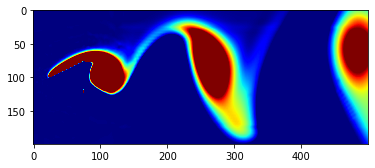

In [13]:
%matplotlib inline
from matplotlib import animation , rc

fig = plt.figure()

w_z_reduced = w_z_combined[::10,:,:]

t = w_z_reduced.shape[0]
m = w_z_reduced.shape[1]
n = w_z_reduced.shape[2]


data = np.zeros((m, n))
im = plt.imshow(data, cmap='jet', vmin=0, vmax=1)

def init():
    im.set_data(np.zeros((m, n)))
    return (im,)

def animate(i):
    frame = w_z_reduced[i,:,:]
    im.set_data(frame)
    return (im,)

rc('animation', html='jshtml')
anim = animation.FuncAnimation(fig, animate, init_func=init,frames=t, interval=20, blit=True)
anim

In [17]:
directories = ['diamond_ar_1p25', 'diamond_ar_1p5', 'diamond_ar_1p66', 'diamond_ar_2p0',
              'triangle_ar_1p25', 'triangle_ar_1p5', 'triangle_ar_1p66', 'triangle_ar_2p0',
              'cylinder_half', 'cylinder_half_flipped']

w_z_combined = []
for directory in directories:
    full_directory = os.path.join('./data', directory, 'w_z.npy')
    w_z = np.load(full_directory)
    w_z_combined.append(w_z[100:,:,:])

w_z_combined = np.concatenate(w_z_combined, axis=0)
print(f'shape of {w_z_combined.shape}')

obstacle = 'combined_modified_primitives'
pwd = '/fsx/python_ml/flow_reconstruction/data'

if os.path.exists(os.path.join(pwd, obstacle)) != True:
    new_folder = os.path.join(pwd, obstacle)
    os.mkdir(new_folder)
    print(f'created {new_folder}')
    
with open(os.path.join(pwd, obstacle, 'w_z.npy'), 'wb') as f:
    np.save(f, w_z_combined)

shape of (4000, 200, 500)
created /fsx/python_ml/flow_reconstruction/data/combined_modified_primitives


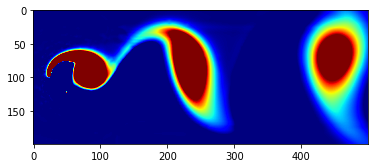

In [18]:
%matplotlib inline
from matplotlib import animation , rc

fig = plt.figure()

w_z_reduced = w_z_combined[::10,:,:]

t = w_z_reduced.shape[0]
m = w_z_reduced.shape[1]
n = w_z_reduced.shape[2]


data = np.zeros((m, n))
im = plt.imshow(data, cmap='jet', vmin=0, vmax=1)

def init():
    im.set_data(np.zeros((m, n)))
    return (im,)

def animate(i):
    frame = w_z_reduced[i,:,:]
    im.set_data(frame)
    return (im,)

rc('animation', html='jshtml')
anim = animation.FuncAnimation(fig, animate, init_func=init,frames=t, interval=20, blit=True)
anim

In [14]:
pwd = f'/fsx/example-case/bezier_geometry_re100_transient/dataset_test'
csv_files = os.listdir(pwd)
csv_files.sort()
csv_files = [csv_file for csv_file in csv_files if os.path.isdir(os.path.join(pwd, csv_file))]

print('Available files are:\n')
for csv_file in csv_files: print(csv_file)

Available files are:

shape_0
shape_1


In [ ]:
cwd = '/fsx/example-case/bezier_geometry_re100_transient/dataset_test'
geometry_directory = 'shape_0'

extract_folder = os.path.join()

csv_files = os.listdir(pwd)
csv_files.sort()
csv_files = [os.path.join(pwd, csv_file) for csv_file in csv_files]

ny = 200
nx = 500

print(f'There is {len(csv_files)} in this folder. There should be 500.')

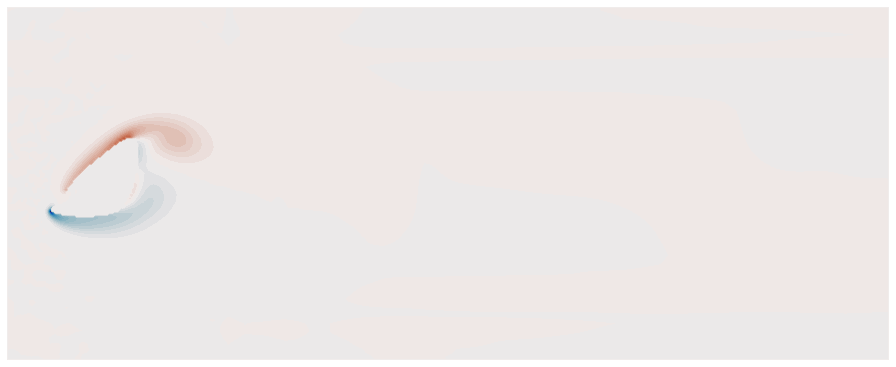

In [21]:
csv_file = '/fsx/example-case/bezier_geometry_re100_transient/dataset_test/shape_0/extracts/dataset_000000.csv'

ny = 200
nx = 500

obstacle = np.zeros((ny, nx))

data = pd.read_csv(csv_file)
    
w_z[0,:,:] = np.array(data['vorticity:2']).reshape(ny, nx)


import cmocean
import matplotlib.patches as mpatches

sample = w_z[0,:,:]
# sample =np.interp(sample, (sample.min(), sample.max()), (-5, +5))

plt.figure(facecolor="white",  edgecolor='k', figsize=(15.8,9.4))

x = np.arange(0, nx, 1)
y = np.arange(0, ny, 1)
mX, mY = np.meshgrid(x, y)
minmax1 = np.max(np.abs(sample)) * 0.65

im = plt.imshow(sample, cmap=cmocean.cm.balance, interpolation='none', vmin=-minmax1, vmax=minmax1)
plt.contourf(mX, mY, sample, 80, cmap=cmocean.cm.balance, alpha=1, vmin=-minmax1, vmax=minmax1)

wedge = mpatches.Wedge((0,99), 33, 270, 90, ec="#636363", color='#636363',lw = 5, zorder=200)
# im.axes.add_patch(p=wedge)    

plt.axis('off')
plt.show()

In [33]:
data

,U:0,U:1,U:2,U_0:0,U_0:1,U_0:2,p,vorticity:0,vorticity:1,vorticity:2,yPlus,vtkValidPointMask,vtkGhostType,Points:0,Points:1,Points:2
0,0.99708,-0.068438,-4.556000e-21,0.99728,-0.068307,-4.556400e-21,0.095558,-4.845200e-20,-9.790000e-19,6.505500e-04,0.0,1,0,-0.99999,-2.0,5.000000e-07
1,0.99791,-0.069122,-4.148100e-21,0.99811,-0.068987,-4.150400e-21,0.095058,-1.949500e-19,-9.581000e-19,4.975400e-04,0.0,1,0,-0.97995,-2.0,5.000000e-07
2,0.99874,-0.069806,-3.740200e-21,0.99894,-0.069668,-3.744300e-21,0.094558,-3.414400e-19,-9.371900e-19,3.445200e-04,0.0,1,0,-0.95991,-2.0,5.000000e-07
3,0.99958,-0.070482,-3.200800e-21,0.99979,-0.070340,-3.207300e-21,0.094049,-5.191500e-19,-9.016000e-19,1.845900e-04,0.0,1,0,-0.93987,-2.0,5.000000e-07
4,1.00050,-0.071085,-1.469500e-21,1.00070,-0.070939,-1.482500e-21,0.093449,-9.740700e-19,-7.317700e-19,-4.948900e-05,0.0,1,0,-0.91983,-2.0,5.000000e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0.99646,0.000534,-1.549000e-22,0.99648,0.000523,-1.542700e-22,-0.004381,-1.400800e-20,9.797700e-21,-6.746800e-07,0.0,1,0,8.91980,2.0,5.000000e-07
99996,0.99648,0.000540,-1.731900e-22,0.99650,0.000529,-1.725500e-22,-0.004362,-1.502400e-20,1.371600e-20,-6.747600e-07,0.0,1,0,8.93990,2.0,5.000000e-07
99997,0.99650,0.000546,-1.914900e-22,0.99652,0.000535,-1.908400e-22,-0.004343,-1.603900e-20,1.763500e-20,-6.748500e-07,0.0,1,0,8.95990,2.0,5.000000e-07
99998,0.99652,0.000552,-1.850600e-22,0.99654,0.000541,-1.844200e-22,-0.004324,-1.596900e-20,1.603100e-20,-6.717000e-07,0.0,1,0,8.98000,2.0,5.000000e-07


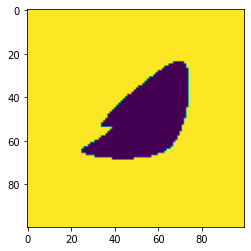

(100, 100)


In [28]:
binary_geometry = data['vtkValidPointMask'].to_numpy()
binary_geometry = binary_geometry.reshape(ny, nx)
binary_geometry = binary_geometry[36:164, 0:100]

plt.figure()
plt.imshow(binary_geometry)
plt.show()

print(binary_geometry.shape)

In [51]:
!pip install scikit-fmm==2019.1.30

     |████████████████████████████████| 418 kB 12.4 MB/s eta 0:00:01
  ERROR: Command errored out with exit status 1:
   command: /fsx/python_ml/venv/bin/python3 -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'/tmp/pip-install-76lsbbd0/scikit-fmm/setup.py'"'"'; __file__='"'"'/tmp/pip-install-76lsbbd0/scikit-fmm/setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d /tmp/pip-wheel-6fpfw18z
       cwd: /tmp/pip-install-76lsbbd0/scikit-fmm/
  Complete output (46 lines):
  running bdist_wheel
  running build
  running config_cc
  unifing config_cc, config, build_clib, build_ext, build commands --compiler options
  running config_fc
  unifing config_fc, config, build_clib, build_ext, build commands --fcompiler options
  running build_src
  build_src
  building extension "skfmm.cfmm" sources
  building extension "skfmm.pheap" sources
  build_src: 

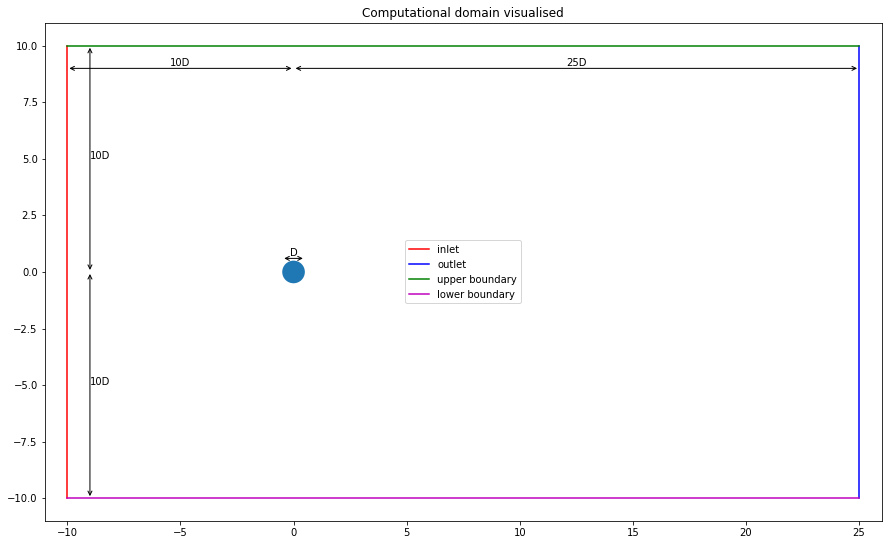

In [93]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

fig, ax = plt.subplots(figsize=(15,10))
circ = mpatches.Circle((0, 0), radius=0.5)
ax.plot([-10,-10], [-10,10], color='r', label='inlet')
ax.plot([25,25], [-10,10], color='b', label='outlet')
ax.plot([-10,25], [10,10], color='g', label='upper boundary')
ax.plot([-10,25], [-10,-10], color='m', label='lower boundary')
ax.add_patch(circ)

# dimensions domain
ax.annotate(
    '', xy=(0,9), xytext=(-10,9),
    arrowprops=dict(facecolor='black', arrowstyle='<->'),
)
ax.annotate(
    '', xy=(0,9), xytext=(25,9),
    arrowprops=dict(facecolor='black', arrowstyle='<->'),
)
ax.annotate(
    '', xy=(-9,-10), xytext=(-9,0),
    arrowprops=dict(facecolor='black', arrowstyle='<->'),
)
ax.annotate(
    '', xy=(-9,10), xytext=(-9,0),
    arrowprops=dict(facecolor='black', arrowstyle='<->'),
)

# dimensions circle
ax.annotate(
    '', xy=(0.5,0.6), xytext=(-0.5,0.6),
    arrowprops=dict(facecolor='black', arrowstyle='<->'),
)

# dimension values domain
ax.annotate(
    '10D', xy=(-5,9.1), ha='center'
)
ax.annotate(
    '25D', xy=(12.5,9.1), ha='center'
)
ax.annotate(
    '10D', xy=(-9,5), ha='left'
)
ax.annotate(
    '10D', xy=(-9,-5), ha='left'
)

# dimension values domain
ax.annotate(
    'D', xy=(0,0.7), ha='center'
)

ax.set_xlim([-11, 26])
ax.set_ylim([-11, 11])
ax.set_aspect(1)
ax.legend()
ax.set_title('Computational domain visualised')
plt.show()